# Cleaning Source 1 Data
--------------------------------

Chilbolton beam sensors coordinates are also included at the end of this notebook.

<div class="alert alert-block alert-info">
<b>DATA:</b> Need to replace data file paths with your own local path. The files are all located in the folder:<br>
Paper 1: Code/Data/...
</div>

<div class="alert alert-block alert-warning">
<b>Warning:</b> Make sure to load the "Clean_data" files.
</div>

In [1]:
from scipy.stats import circmean
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

#### Loading in all data txt files

<div class="alert alert-block alert-info">
<b>DATA:</b> Need to replace data file paths with your own local path. The files are all located in the folder:<br>
Packages/Paper 1: Code/Data/Chilbolton_data_files/Preprocessed/...
</div>

In [2]:
reflectors_data_rel2 = {}
reflectors_data_rel3 = {}
reflectors_data_rel7 = {}

for i in range(1,8):
    # Read the file
    reflectors_data_rel2[i] = pd.read_csv(f'/home/newmant1/PhD/Packages/Paper 1: Code/Data/Chilbolton_data_files/Preprocessed/20170509/rel02/Clean_data/reflector_{i}', sep='\s+', header=None)
    reflectors_data_rel3[i] = pd.read_csv(f'/home/newmant1/PhD/Packages/Paper 1: Code/Data/Chilbolton_data_files/Preprocessed/20170509/rel03/Clean_data/reflector_{i}', sep='\s+', header=None)
    reflectors_data_rel7[i] = pd.read_csv(f'/home/newmant1/PhD/Packages/Paper 1: Code/Data/Chilbolton_data_files/Preprocessed/20170510/rel07/Clean_data/reflector_{i}', sep='\s+', header=None)



## A. Raw Data

#### A.1 Keeping only the time, wind velocities and CH4 measurements

In [3]:
reflector_1_rel2 = reflectors_data_rel2[1][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_2_rel2 = reflectors_data_rel2[2][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_3_rel2 = reflectors_data_rel2[3][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_4_rel2 = reflectors_data_rel2[4][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_5_rel2 = reflectors_data_rel2[5][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_6_rel2 = reflectors_data_rel2[6][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_7_rel2 = reflectors_data_rel2[7][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})

reflector_1_rel3 = reflectors_data_rel3[1][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_2_rel3 = reflectors_data_rel3[2][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_3_rel3 = reflectors_data_rel3[3][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_4_rel3 = reflectors_data_rel3[4][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_5_rel3 = reflectors_data_rel3[5][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_6_rel3 = reflectors_data_rel3[6][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_7_rel3 = reflectors_data_rel3[7][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})

reflector_1_rel7 = reflectors_data_rel7[1][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_2_rel7 = reflectors_data_rel7[2][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_3_rel7 = reflectors_data_rel7[3][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_4_rel7 = reflectors_data_rel7[4][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_5_rel7 = reflectors_data_rel7[5][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_6_rel7 = reflectors_data_rel7[6][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})
reflector_7_rel7 = reflectors_data_rel7[7][[0,4,5,6,8]].rename(columns={0:'Time', 4:'wind_x', 5:'wind_y', 6:'wind_z', 8:'Measurements'})

#### A.2 Tranforming elapsed time to clock time

In [4]:
def add_clock_time(df, start_time_str):
    # Convert the 'Time' column to timedelta
    df['Time'] = pd.to_timedelta(df['Time'], unit='s')

    # Define the start time
    start_time = pd.Timestamp(start_time_str)
    df['Clock_Time'] = (start_time + df['Time'])
    df = df[['Clock_Time', 'wind_x', 'wind_y', 'wind_z', 'Measurements']]
    
    return df

In [5]:
reflector_1_rel2 = add_clock_time(reflector_1_rel2, '11:26:21')
reflector_2_rel2 = add_clock_time(reflector_2_rel2, '11:26:21')
reflector_3_rel2 = add_clock_time(reflector_3_rel2, '11:26:22')
reflector_4_rel2 = add_clock_time(reflector_4_rel2, '11:13:20')
reflector_5_rel2 = add_clock_time(reflector_5_rel2, '11:26:23')
reflector_6_rel2 = add_clock_time(reflector_6_rel2, '11:26:23')
reflector_7_rel2 = add_clock_time(reflector_7_rel2, '11:26:24')

reflector_1_rel3 = add_clock_time(reflector_1_rel3, '12:37:25')
reflector_2_rel3 = add_clock_time(reflector_2_rel3, '12:37:25')
reflector_3_rel3 = add_clock_time(reflector_3_rel3, '12:37:26')
reflector_4_rel3 = add_clock_time(reflector_4_rel3, '12:37:26')
reflector_5_rel3 = add_clock_time(reflector_5_rel3, '12:37:27')
reflector_6_rel3 = add_clock_time(reflector_6_rel3, '12:37:27')
reflector_7_rel3 = add_clock_time(reflector_7_rel3, '12:37:24')

reflector_1_rel7 = add_clock_time(reflector_1_rel7, '15:03:58')
reflector_2_rel7 = add_clock_time(reflector_2_rel7, '15:03:58')
reflector_3_rel7 = add_clock_time(reflector_3_rel7, '15:03:54')
reflector_4_rel7 = add_clock_time(reflector_4_rel7, '15:03:54')
reflector_5_rel7 = add_clock_time(reflector_5_rel7, '15:03:55')
reflector_6_rel7 = add_clock_time(reflector_6_rel7, '15:03:55')
reflector_7_rel7 = add_clock_time(reflector_7_rel7, '15:03:55')


### A.2 Calculating wind speed and direction based on speeds along the x-axis and y-axis

In meteorological convention, wind direction is measured in degrees clockwise from True North. North is 0°, East is 90°, South is 180°, and West is 270°.

In mathematical convention, angles are typically measured in degrees counterclockwise from the positive x-axis (East). East is 0°, North is 90°, West is 180°, and South is 270°.

If we subtract the meteorological degrees from 360, we switch from clockwise to counterclockwise, but North (0 degrees in meteorological) becomes East (360 degrees in mathematical). To correct this, we add 90 degrees, resulting in 450 degrees.

To convert from meteorological to mathematical convention, you can use the following formula:

```python
mathematical_direction = (450 - meteorological_direction) % 360
```

However, Mirico has it's axis and measurements in mathematical degrees, East is 0°, North is 90°. Therefore we do not need the transformation normally required. Therefore, using the Chilbolton dataset, the horizontal wind direction produced by the function below has 0° East and 90° North and the vertical wind direction has 0° parallel to the ground and 90° perpendicular to the ground and pointing away from it.



In [6]:
def calculate_wind_direction_and_speed(df, x_wind_speed_column, y_wind_speed_column, z_wind_speed_column):
    # Calculate the wind speed
    df['Wind Speed'] = np.sqrt(df[x_wind_speed_column]**2 + df[y_wind_speed_column]**2 + df[z_wind_speed_column]**2)

    # Calculate horizontal wind direction
    df['Wind Direction'] = np.arctan2(df[x_wind_speed_column], (-df[y_wind_speed_column])) * (180.0 / np.pi) % 360

    # Calculate the horizontal wind speed
    horizontal_wind_speed = np.sqrt(df[x_wind_speed_column]**2 + df[y_wind_speed_column]**2)

    # Calculate vertical wind direction
    df['Vertical Wind Direction'] = np.arctan2(df[z_wind_speed_column], horizontal_wind_speed) * (180/np.pi)
    
    # Set time_column as the index
    df['Clock_Time'] = pd.to_datetime(df['Clock_Time']).dt.floor('S')
    df = df.set_index('Clock_Time')

    # Calculate the rolling standard deviation of wind direction
    df['Wind Direction std'] = df['Wind Direction'].rolling('60s').std()
    df['Vertical Wind Direction std'] = df['Vertical Wind Direction'].rolling('60s').std()
    
    return df[['Wind Speed', 'Wind Direction', 'Vertical Wind Direction', 'Measurements', 'Vertical Wind Direction std', 'Wind Direction std']]

In [7]:
reflector_1_rel2 = calculate_wind_direction_and_speed(reflector_1_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_2_rel2 = calculate_wind_direction_and_speed(reflector_2_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_3_rel2 = calculate_wind_direction_and_speed(reflector_3_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_4_rel2 = calculate_wind_direction_and_speed(reflector_4_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_5_rel2 = calculate_wind_direction_and_speed(reflector_5_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_6_rel2 = calculate_wind_direction_and_speed(reflector_6_rel2, 'wind_x', 'wind_y', 'wind_z')
reflector_7_rel2 = calculate_wind_direction_and_speed(reflector_7_rel2, 'wind_x', 'wind_y', 'wind_z')

reflector_1_rel3 = calculate_wind_direction_and_speed(reflector_1_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_2_rel3 = calculate_wind_direction_and_speed(reflector_2_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_3_rel3 = calculate_wind_direction_and_speed(reflector_3_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_4_rel3 = calculate_wind_direction_and_speed(reflector_4_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_5_rel3 = calculate_wind_direction_and_speed(reflector_5_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_6_rel3 = calculate_wind_direction_and_speed(reflector_6_rel3, 'wind_x', 'wind_y', 'wind_z')
reflector_7_rel3 = calculate_wind_direction_and_speed(reflector_7_rel3, 'wind_x', 'wind_y', 'wind_z')

reflector_1_rel7 = calculate_wind_direction_and_speed(reflector_1_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_2_rel7 = calculate_wind_direction_and_speed(reflector_2_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_3_rel7 = calculate_wind_direction_and_speed(reflector_3_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_4_rel7 = calculate_wind_direction_and_speed(reflector_4_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_5_rel7 = calculate_wind_direction_and_speed(reflector_5_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_6_rel7 = calculate_wind_direction_and_speed(reflector_6_rel7, 'wind_x', 'wind_y', 'wind_z')
reflector_7_rel7 = calculate_wind_direction_and_speed(reflector_7_rel7, 'wind_x', 'wind_y', 'wind_z')

## B. Cleaning Data

### B.1 Release 2

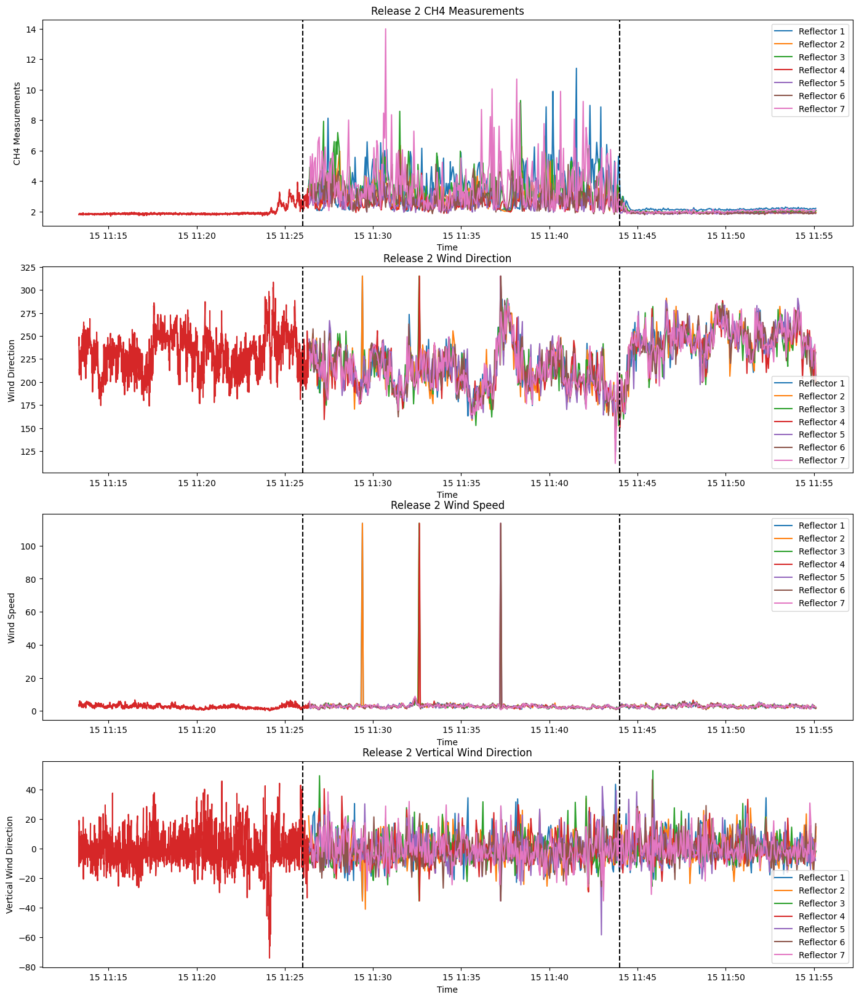

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 2 CH4 Measurements')
plt.plot(reflector_1_rel2.index, reflector_1_rel2['Measurements'])
plt.plot(reflector_2_rel2.index, reflector_2_rel2['Measurements'])
plt.plot(reflector_3_rel2.index, reflector_3_rel2['Measurements'])
plt.plot(reflector_4_rel2.index, reflector_4_rel2['Measurements'])
plt.plot(reflector_5_rel2.index, reflector_5_rel2['Measurements'])
plt.plot(reflector_6_rel2.index, reflector_6_rel2['Measurements'])
plt.plot(reflector_7_rel2.index, reflector_7_rel2['Measurements'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 2 Wind Direction')
plt.plot(reflector_1_rel2.index, reflector_1_rel2['Wind Direction'])
plt.plot(reflector_2_rel2.index, reflector_2_rel2['Wind Direction'])
plt.plot(reflector_3_rel2.index, reflector_3_rel2['Wind Direction'])
plt.plot(reflector_4_rel2.index, reflector_4_rel2['Wind Direction'])
plt.plot(reflector_5_rel2.index, reflector_5_rel2['Wind Direction'])
plt.plot(reflector_6_rel2.index, reflector_6_rel2['Wind Direction'])
plt.plot(reflector_7_rel2.index, reflector_7_rel2['Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 2 Wind Speed')
plt.plot(reflector_1_rel2.index, reflector_1_rel2['Wind Speed'])
plt.plot(reflector_2_rel2.index, reflector_2_rel2['Wind Speed'])
plt.plot(reflector_3_rel2.index, reflector_3_rel2['Wind Speed'])
plt.plot(reflector_4_rel2.index, reflector_4_rel2['Wind Speed'])
plt.plot(reflector_5_rel2.index, reflector_5_rel2['Wind Speed'])
plt.plot(reflector_6_rel2.index, reflector_6_rel2['Wind Speed'])
plt.plot(reflector_7_rel2.index, reflector_7_rel2['Wind Speed'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 2 Vertical Wind Direction')
plt.plot(reflector_1_rel2.index, reflector_1_rel2['Vertical Wind Direction'])
plt.plot(reflector_2_rel2.index, reflector_2_rel2['Vertical Wind Direction'])
plt.plot(reflector_3_rel2.index, reflector_3_rel2['Vertical Wind Direction'])
plt.plot(reflector_4_rel2.index, reflector_4_rel2['Vertical Wind Direction'])
plt.plot(reflector_5_rel2.index, reflector_5_rel2['Vertical Wind Direction'])
plt.plot(reflector_6_rel2.index, reflector_6_rel2['Vertical Wind Direction'])
plt.plot(reflector_7_rel2.index, reflector_7_rel2['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

In [9]:
reflector_1_rel2_filtered = reflector_1_rel2[(reflector_1_rel2['Wind Speed'] > 1) & (reflector_1_rel2['Wind Speed'] < 20)]
reflector_2_rel2_filtered = reflector_2_rel2[(reflector_2_rel2['Wind Speed'] > 1) & (reflector_2_rel2['Wind Speed'] < 20)]
reflector_3_rel2_filtered = reflector_3_rel2[(reflector_3_rel2['Wind Speed'] > 1) & (reflector_3_rel2['Wind Speed'] < 20)]
reflector_4_rel2_filtered = reflector_4_rel2[(reflector_4_rel2['Wind Speed'] > 1) & (reflector_4_rel2['Wind Speed'] < 20)]
reflector_5_rel2_filtered = reflector_5_rel2[(reflector_5_rel2['Wind Speed'] > 1) & (reflector_5_rel2['Wind Speed'] < 20)]
reflector_6_rel2_filtered = reflector_6_rel2[(reflector_6_rel2['Wind Speed'] > 1) & (reflector_6_rel2['Wind Speed'] < 20)]
reflector_7_rel2_filtered = reflector_7_rel2[(reflector_7_rel2['Wind Speed'] > 1) & (reflector_7_rel2['Wind Speed'] < 20)]

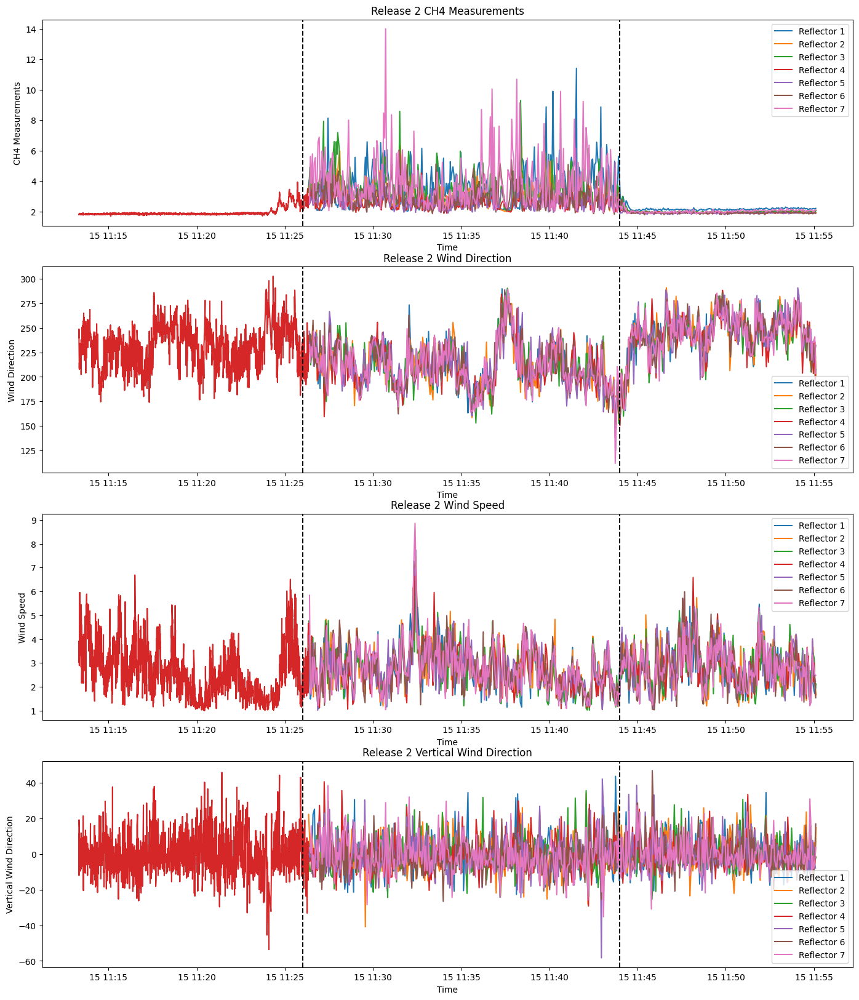

In [10]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 2 CH4 Measurements')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Measurements'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Measurements'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Measurements'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Measurements'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Measurements'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Measurements'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 2 Wind Direction')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Wind Direction'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Wind Direction'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Wind Direction'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Wind Direction'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Wind Direction'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Wind Direction'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 2 Wind Speed')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Wind Speed'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Wind Speed'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Wind Speed'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Wind Speed'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Wind Speed'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Wind Speed'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 2 Vertical Wind Direction')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.show()

In [11]:
reflector_1_rel2_filtered = reflector_1_rel2_filtered[(reflector_1_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_1_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_2_rel2_filtered = reflector_2_rel2_filtered[(reflector_2_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_2_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_3_rel2_filtered = reflector_3_rel2_filtered[(reflector_3_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_3_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_4_rel2_filtered = reflector_4_rel2_filtered[(reflector_4_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_4_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_5_rel2_filtered = reflector_5_rel2_filtered[(reflector_5_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_5_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_6_rel2_filtered = reflector_6_rel2_filtered[(reflector_6_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_6_rel2_filtered.index <= pd.Timestamp('11:43:59'))]
reflector_7_rel2_filtered = reflector_7_rel2_filtered[(reflector_7_rel2_filtered.index >= pd.Timestamp('11:26:00')) & (reflector_7_rel2_filtered.index <= pd.Timestamp('11:43:59'))]

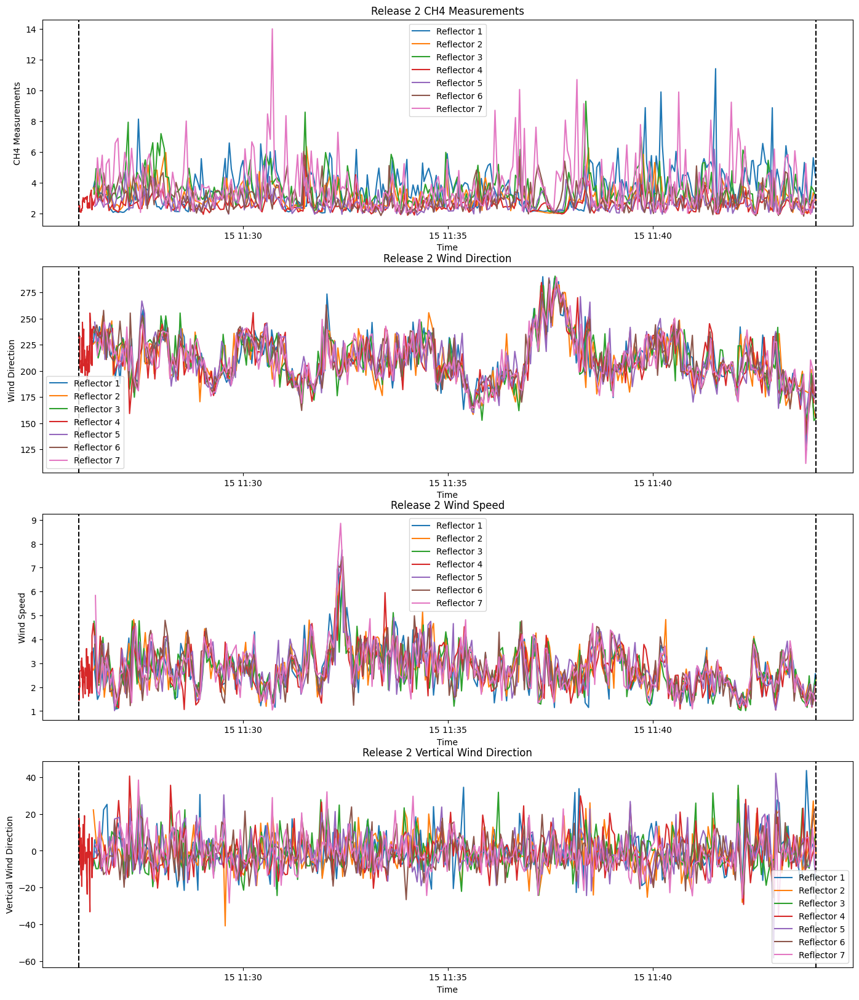

In [12]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 2 CH4 Measurements')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Measurements'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Measurements'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Measurements'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Measurements'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Measurements'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Measurements'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 2 Wind Direction')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Wind Direction'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Wind Direction'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Wind Direction'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Wind Direction'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Wind Direction'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Wind Direction'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 2 Wind Speed')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Wind Speed'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Wind Speed'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Wind Speed'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Wind Speed'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Wind Speed'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Wind Speed'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 2 Vertical Wind Direction')
plt.plot(reflector_1_rel2_filtered.index, reflector_1_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel2_filtered.index, reflector_2_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel2_filtered.index, reflector_3_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel2_filtered.index, reflector_4_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel2_filtered.index, reflector_5_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel2_filtered.index, reflector_6_rel2_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel2_filtered.index, reflector_7_rel2_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.show()

<br>
<br>
<br>

### B.2 Release 3

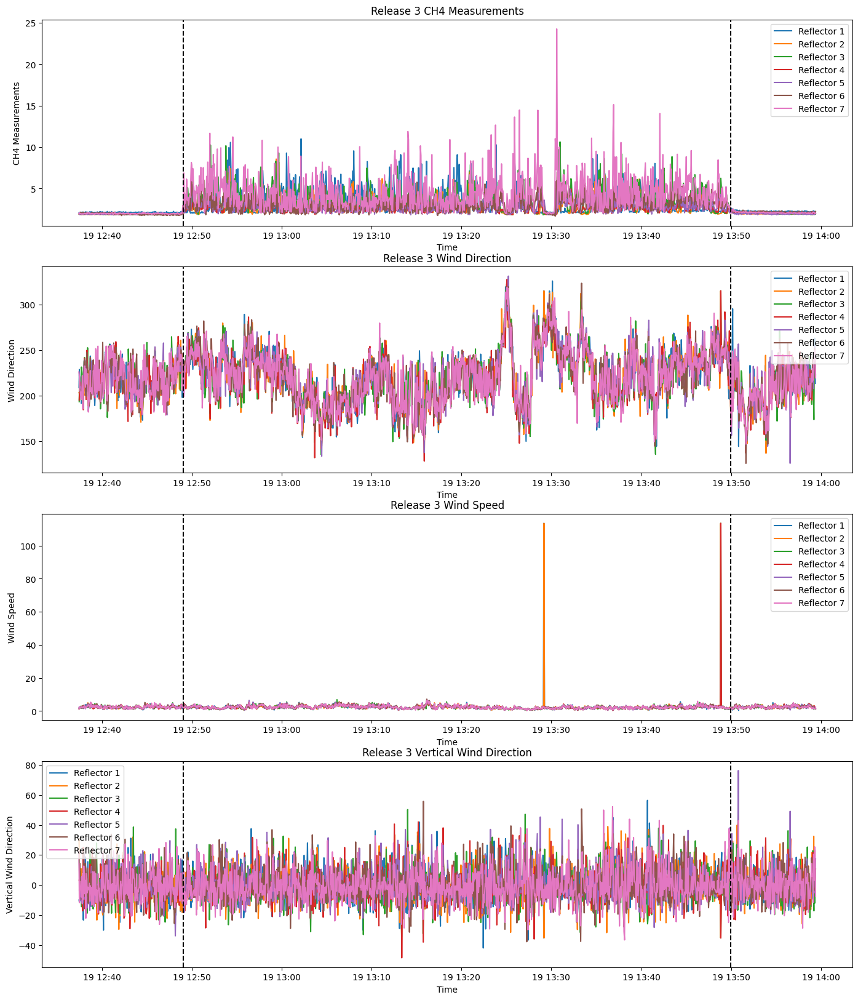

In [13]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 3 CH4 Measurements')
plt.plot(reflector_1_rel3.index, reflector_1_rel3['Measurements'])
plt.plot(reflector_2_rel3.index, reflector_2_rel3['Measurements'])
plt.plot(reflector_3_rel3.index, reflector_3_rel3['Measurements'])
plt.plot(reflector_4_rel3.index, reflector_4_rel3['Measurements'])
plt.plot(reflector_5_rel3.index, reflector_5_rel3['Measurements'])
plt.plot(reflector_6_rel3.index, reflector_6_rel3['Measurements'])
plt.plot(reflector_7_rel3.index, reflector_7_rel3['Measurements'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 3 Wind Direction')
plt.plot(reflector_1_rel3.index, reflector_1_rel3['Wind Direction'])
plt.plot(reflector_2_rel3.index, reflector_2_rel3['Wind Direction'])
plt.plot(reflector_3_rel3.index, reflector_3_rel3['Wind Direction'])
plt.plot(reflector_4_rel3.index, reflector_4_rel3['Wind Direction'])
plt.plot(reflector_5_rel3.index, reflector_5_rel3['Wind Direction'])
plt.plot(reflector_6_rel3.index, reflector_6_rel3['Wind Direction'])
plt.plot(reflector_7_rel3.index, reflector_7_rel3['Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 3 Wind Speed')
plt.plot(reflector_1_rel3.index, reflector_1_rel3['Wind Speed'])
plt.plot(reflector_2_rel3.index, reflector_2_rel3['Wind Speed'])
plt.plot(reflector_3_rel3.index, reflector_3_rel3['Wind Speed'])
plt.plot(reflector_4_rel3.index, reflector_4_rel3['Wind Speed'])
plt.plot(reflector_5_rel3.index, reflector_5_rel3['Wind Speed'])
plt.plot(reflector_6_rel3.index, reflector_6_rel3['Wind Speed'])
plt.plot(reflector_7_rel3.index, reflector_7_rel3['Wind Speed'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 3 Vertical Wind Direction')
plt.plot(reflector_1_rel3.index, reflector_1_rel3['Vertical Wind Direction'])
plt.plot(reflector_2_rel3.index, reflector_2_rel3['Vertical Wind Direction'])
plt.plot(reflector_3_rel3.index, reflector_3_rel3['Vertical Wind Direction'])
plt.plot(reflector_4_rel3.index, reflector_4_rel3['Vertical Wind Direction'])
plt.plot(reflector_5_rel3.index, reflector_5_rel3['Vertical Wind Direction'])
plt.plot(reflector_6_rel3.index, reflector_6_rel3['Vertical Wind Direction'])
plt.plot(reflector_7_rel3.index, reflector_7_rel3['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

In [14]:
reflector_1_rel3_filtered = reflector_1_rel3[(reflector_1_rel3['Wind Speed'] > 1) & (reflector_1_rel3['Wind Speed'] < 20)]
reflector_2_rel3_filtered = reflector_2_rel3[(reflector_2_rel3['Wind Speed'] > 1) & (reflector_2_rel3['Wind Speed'] < 20)]
reflector_3_rel3_filtered = reflector_3_rel3[(reflector_3_rel3['Wind Speed'] > 1) & (reflector_3_rel3['Wind Speed'] < 20)]
reflector_4_rel3_filtered = reflector_4_rel3[(reflector_4_rel3['Wind Speed'] > 1) & (reflector_4_rel3['Wind Speed'] < 20)]
reflector_5_rel3_filtered = reflector_5_rel3[(reflector_5_rel3['Wind Speed'] > 1) & (reflector_5_rel3['Wind Speed'] < 20)]
reflector_6_rel3_filtered = reflector_6_rel3[(reflector_6_rel3['Wind Speed'] > 1) & (reflector_6_rel3['Wind Speed'] < 20)]
reflector_7_rel3_filtered = reflector_7_rel3[(reflector_7_rel3['Wind Speed'] > 1) & (reflector_7_rel3['Wind Speed'] < 20)]

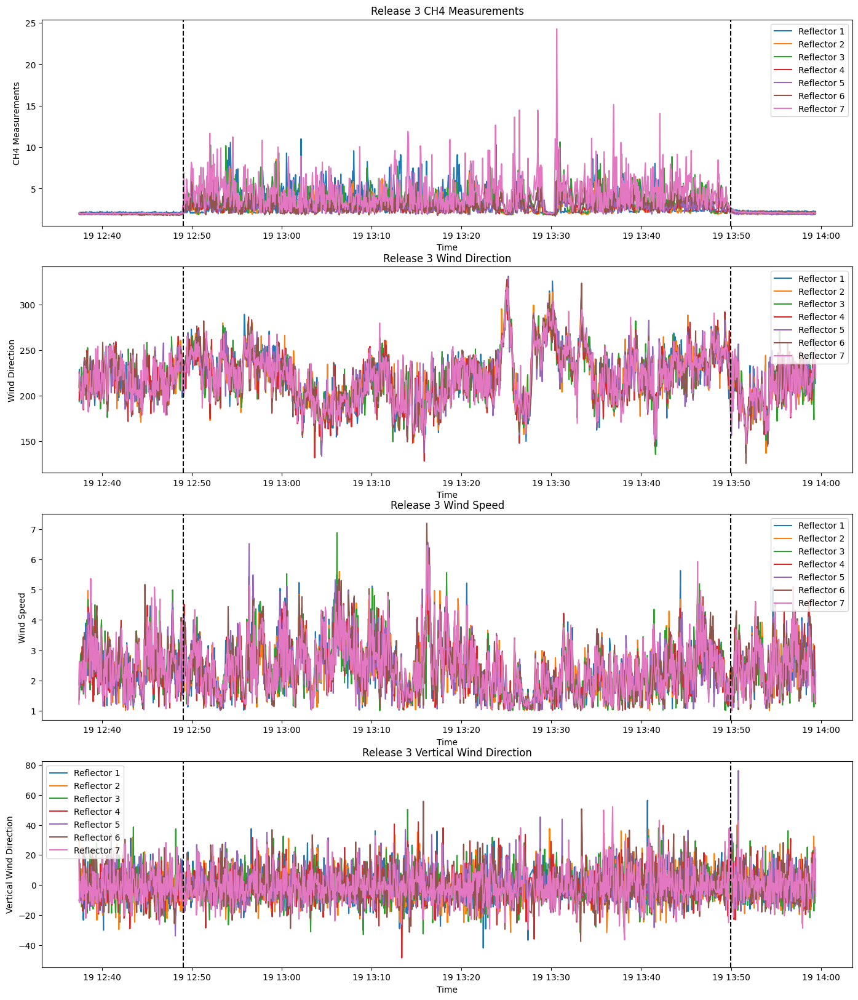

In [15]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 3 CH4 Measurements')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Measurements'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Measurements'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Measurements'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Measurements'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Measurements'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Measurements'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 3 Wind Direction')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Wind Direction'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Wind Direction'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Wind Direction'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Wind Direction'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Wind Direction'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Wind Direction'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 3 Wind Speed')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Wind Speed'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Wind Speed'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Wind Speed'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Wind Speed'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Wind Speed'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Wind Speed'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 3 Vertical Wind Direction')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

In [16]:
reflector_1_rel3_filtered = reflector_1_rel3_filtered[(reflector_1_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_1_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_2_rel3_filtered = reflector_2_rel3_filtered[(reflector_2_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_2_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_3_rel3_filtered = reflector_3_rel3_filtered[(reflector_3_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_3_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_4_rel3_filtered = reflector_4_rel3_filtered[(reflector_4_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_4_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_5_rel3_filtered = reflector_5_rel3_filtered[(reflector_5_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_5_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_6_rel3_filtered = reflector_6_rel3_filtered[(reflector_6_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_6_rel3_filtered.index <= pd.Timestamp('13:49:59'))]
reflector_7_rel3_filtered = reflector_7_rel3_filtered[(reflector_7_rel3_filtered.index >= pd.Timestamp('12:49:00')) & (reflector_7_rel3_filtered.index <= pd.Timestamp('13:49:59'))]

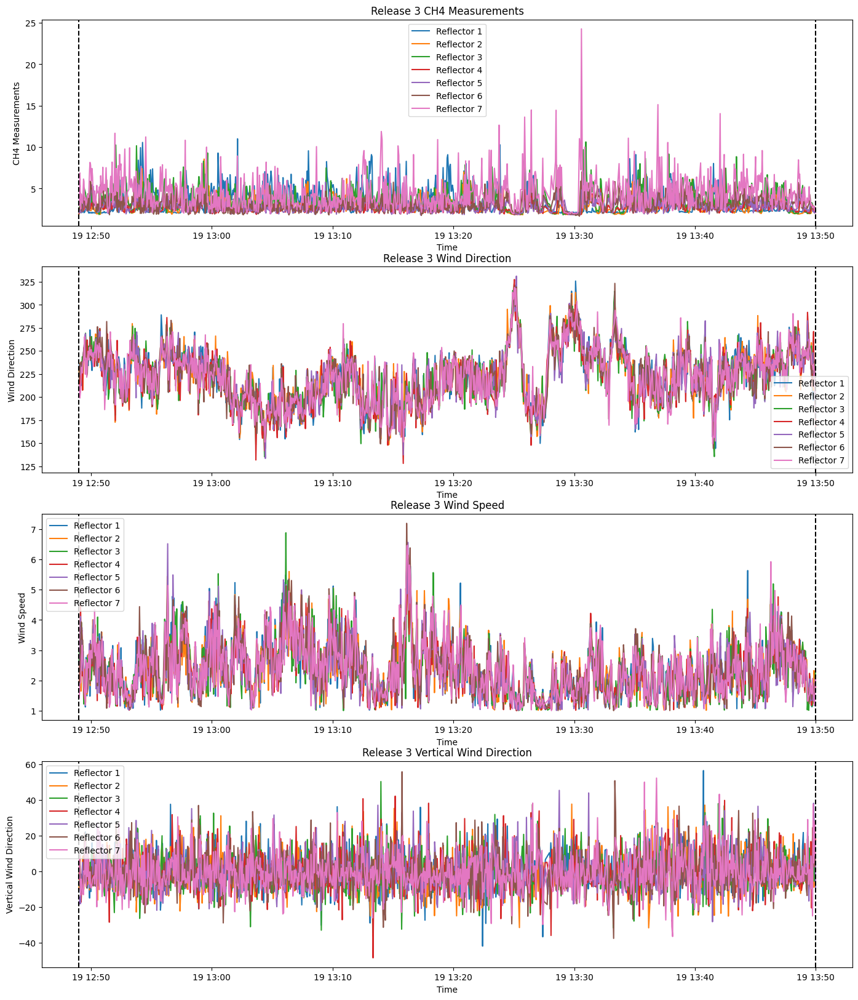

In [17]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 3 CH4 Measurements')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Measurements'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Measurements'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Measurements'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Measurements'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Measurements'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Measurements'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 3 Wind Direction')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Wind Direction'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Wind Direction'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Wind Direction'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Wind Direction'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Wind Direction'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Wind Direction'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 3 Wind Speed')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Wind Speed'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Wind Speed'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Wind Speed'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Wind Speed'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Wind Speed'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Wind Speed'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 3 Vertical Wind Direction')
plt.plot(reflector_1_rel3_filtered.index, reflector_1_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel3_filtered.index, reflector_2_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel3_filtered.index, reflector_3_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel3_filtered.index, reflector_4_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel3_filtered.index, reflector_5_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel3_filtered.index, reflector_6_rel3_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel3_filtered.index, reflector_7_rel3_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

<br>
<br>
<br>

### B.3 Release 7

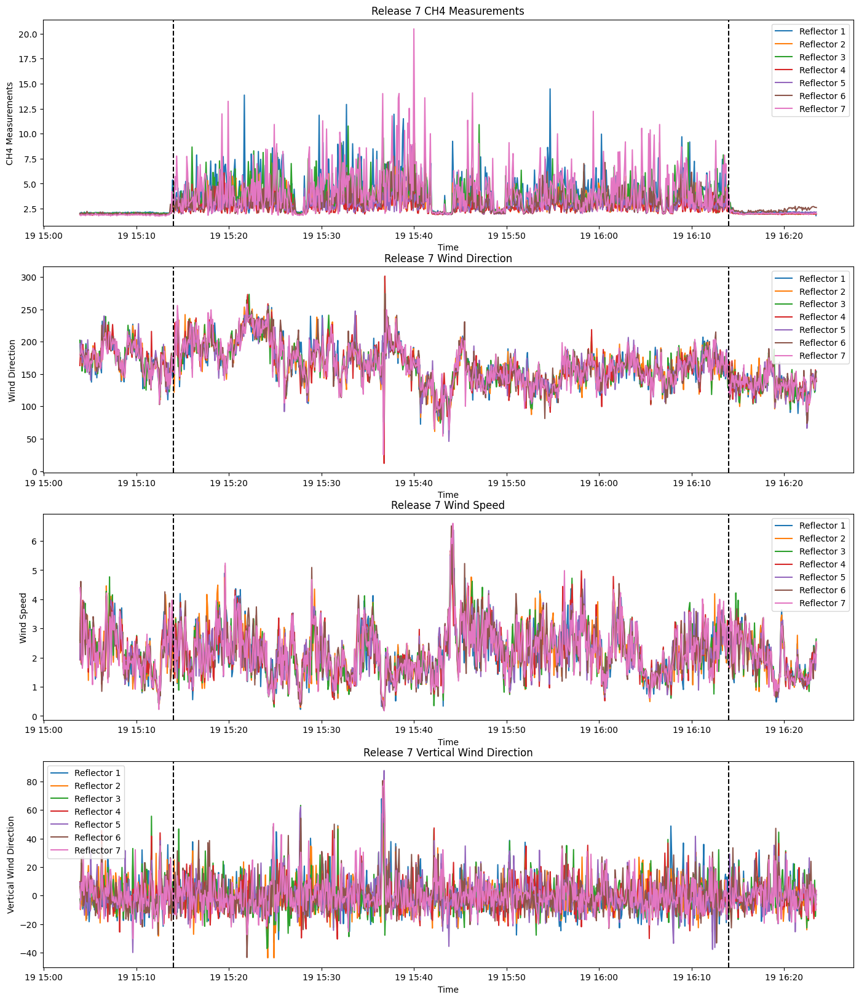

In [18]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 7 CH4 Measurements')
plt.plot(reflector_1_rel7.index, reflector_1_rel7['Measurements'])
plt.plot(reflector_2_rel7.index, reflector_2_rel7['Measurements'])
plt.plot(reflector_3_rel7.index, reflector_3_rel7['Measurements'])
plt.plot(reflector_4_rel7.index, reflector_4_rel7['Measurements'])
plt.plot(reflector_5_rel7.index, reflector_5_rel7['Measurements'])
plt.plot(reflector_6_rel7.index, reflector_6_rel7['Measurements'])
plt.plot(reflector_7_rel7.index, reflector_7_rel7['Measurements'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 7 Wind Direction')
plt.plot(reflector_1_rel7.index, reflector_1_rel7['Wind Direction'])
plt.plot(reflector_2_rel7.index, reflector_2_rel7['Wind Direction'])
plt.plot(reflector_3_rel7.index, reflector_3_rel7['Wind Direction'])
plt.plot(reflector_4_rel7.index, reflector_4_rel7['Wind Direction'])
plt.plot(reflector_5_rel7.index, reflector_5_rel7['Wind Direction'])
plt.plot(reflector_6_rel7.index, reflector_6_rel7['Wind Direction'])
plt.plot(reflector_7_rel7.index, reflector_7_rel7['Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 7 Wind Speed')
plt.plot(reflector_1_rel7.index, reflector_1_rel7['Wind Speed'])
plt.plot(reflector_2_rel7.index, reflector_2_rel7['Wind Speed'])
plt.plot(reflector_3_rel7.index, reflector_3_rel7['Wind Speed'])
plt.plot(reflector_4_rel7.index, reflector_4_rel7['Wind Speed'])
plt.plot(reflector_5_rel7.index, reflector_5_rel7['Wind Speed'])
plt.plot(reflector_6_rel7.index, reflector_6_rel7['Wind Speed'])
plt.plot(reflector_7_rel7.index, reflector_7_rel7['Wind Speed'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 7 Vertical Wind Direction')
plt.plot(reflector_1_rel7.index, reflector_1_rel7['Vertical Wind Direction'])
plt.plot(reflector_2_rel7.index, reflector_2_rel7['Vertical Wind Direction'])
plt.plot(reflector_3_rel7.index, reflector_3_rel7['Vertical Wind Direction'])
plt.plot(reflector_4_rel7.index, reflector_4_rel7['Vertical Wind Direction'])
plt.plot(reflector_5_rel7.index, reflector_5_rel7['Vertical Wind Direction'])
plt.plot(reflector_6_rel7.index, reflector_6_rel7['Vertical Wind Direction'])
plt.plot(reflector_7_rel7.index, reflector_7_rel7['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

In [19]:
reflector_1_rel7_filtered = reflector_1_rel7[(reflector_1_rel7['Wind Speed'] > 1) & (reflector_1_rel7['Wind Speed'] < 20)]
reflector_2_rel7_filtered = reflector_2_rel7[(reflector_2_rel7['Wind Speed'] > 1) & (reflector_2_rel7['Wind Speed'] < 20)]
reflector_3_rel7_filtered = reflector_3_rel7[(reflector_3_rel7['Wind Speed'] > 1) & (reflector_3_rel7['Wind Speed'] < 20)]
reflector_4_rel7_filtered = reflector_4_rel7[(reflector_4_rel7['Wind Speed'] > 1) & (reflector_4_rel7['Wind Speed'] < 20)]
reflector_5_rel7_filtered = reflector_5_rel7[(reflector_5_rel7['Wind Speed'] > 1) & (reflector_5_rel7['Wind Speed'] < 20)]
reflector_6_rel7_filtered = reflector_6_rel7[(reflector_6_rel7['Wind Speed'] > 1) & (reflector_6_rel7['Wind Speed'] < 20)]
reflector_7_rel7_filtered = reflector_7_rel7[(reflector_7_rel7['Wind Speed'] > 1) & (reflector_7_rel7['Wind Speed'] < 20)]

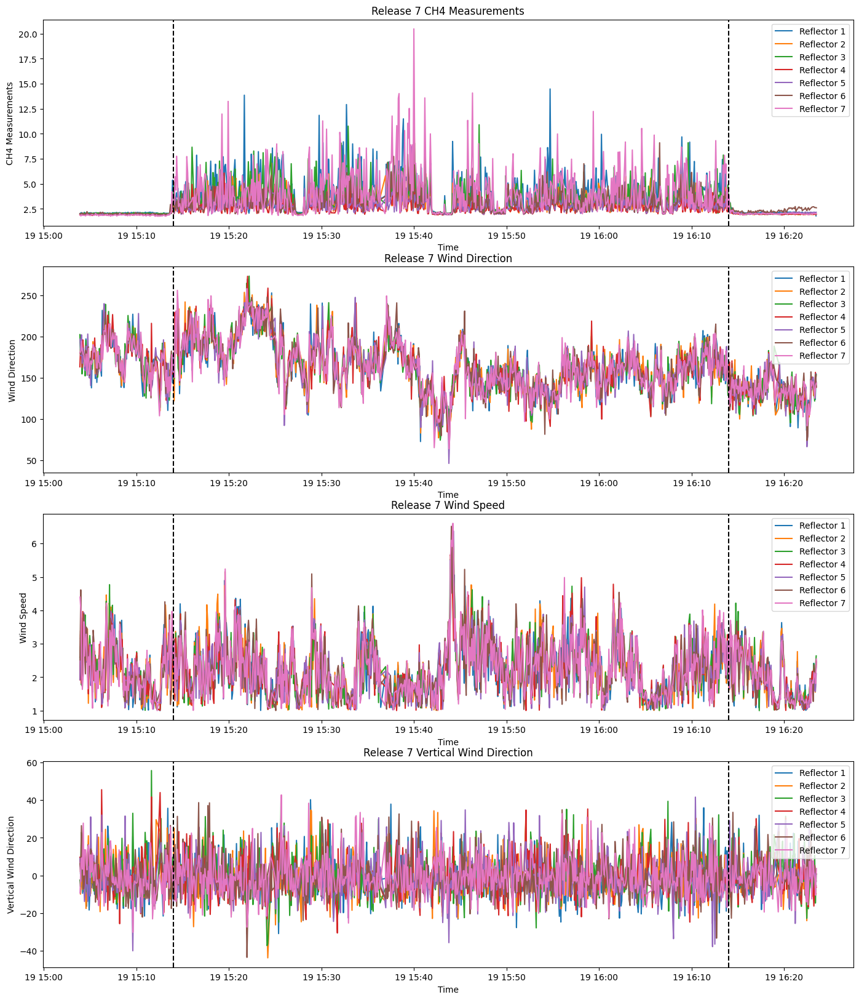

In [20]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 7 CH4 Measurements')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Measurements'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Measurements'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Measurements'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Measurements'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Measurements'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Measurements'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 7 Wind Direction')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Wind Direction'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Wind Direction'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Wind Direction'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Wind Direction'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Wind Direction'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Wind Direction'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 7 Wind Speed')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Wind Speed'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Wind Speed'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Wind Speed'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Wind Speed'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Wind Speed'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Wind Speed'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 7 Vertical Wind Direction')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

In [21]:
reflector_1_rel7_filtered = reflector_1_rel7_filtered[(reflector_1_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_1_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_2_rel7_filtered = reflector_2_rel7_filtered[(reflector_2_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_2_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_3_rel7_filtered = reflector_3_rel7_filtered[(reflector_3_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_3_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_4_rel7_filtered = reflector_4_rel7_filtered[(reflector_4_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_4_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_5_rel7_filtered = reflector_5_rel7_filtered[(reflector_5_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_5_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_6_rel7_filtered = reflector_6_rel7_filtered[(reflector_6_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_6_rel7_filtered.index <= pd.Timestamp('16:13:59'))]
reflector_7_rel7_filtered = reflector_7_rel7_filtered[(reflector_7_rel7_filtered.index >= pd.Timestamp('15:14:00')) & (reflector_7_rel7_filtered.index <= pd.Timestamp('16:13:59'))]

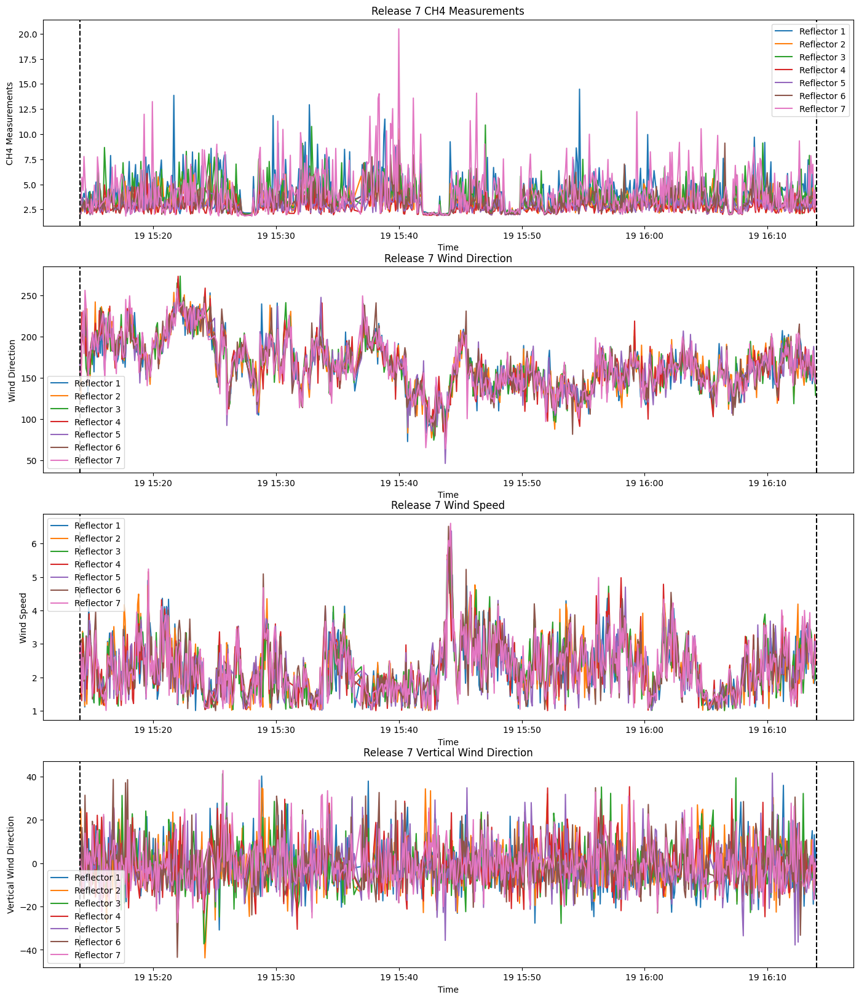

In [22]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 7 CH4 Measurements')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Measurements'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Measurements'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Measurements'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Measurements'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Measurements'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Measurements'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Measurements'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 7 Wind Direction')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Wind Direction'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Wind Direction'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Wind Direction'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Wind Direction'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Wind Direction'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Wind Direction'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 7 Wind Speed')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Wind Speed'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Wind Speed'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Wind Speed'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Wind Speed'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Wind Speed'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Wind Speed'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Wind Speed'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 7 Vertical Wind Direction')
plt.plot(reflector_1_rel7_filtered.index, reflector_1_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_2_rel7_filtered.index, reflector_2_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_3_rel7_filtered.index, reflector_3_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_4_rel7_filtered.index, reflector_4_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_5_rel7_filtered.index, reflector_5_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_6_rel7_filtered.index, reflector_6_rel7_filtered['Vertical Wind Direction'])
plt.plot(reflector_7_rel7_filtered.index, reflector_7_rel7_filtered['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

<br>
<br>
<br>

## C. Averaging data into bins of 1min

In [23]:
def resample_and_average(df):
    # Average CH4 and wind speed
    measurements = df['Measurements'].resample('1min').mean()
    wind_speed = df['Wind Speed'].resample('1min').mean()

    # Average tan(gamma) and tan(gamma) vertical
    tan_gamma_horizontal = np.tan(np.deg2rad(df['Wind Direction std'].resample('1min').mean()))
    tan_gamma_vertical = np.tan(np.deg2rad(df['Vertical Wind Direction std'].resample('1min').mean()))
    

    # Circular average of wind directions
    df_rad_resampled = np.deg2rad(df['Wind Direction']).resample('1min').apply(lambda x: circmean(x))
    df_rad_vertical_resampled = np.deg2rad(df['Vertical Wind Direction']).resample('1min').apply(lambda x: circmean(x))
    # Convert the circular average back to degrees
    wind_direction = np.rad2deg(df_rad_resampled)
    verical_wind_direction = np.rad2deg(df_rad_vertical_resampled)
    
    # Create a new dataframe with the resampled and averaged data
    df_resampled = pd.DataFrame({'Measurements': measurements, 'Wind Speed': wind_speed, 'Wind Direction': wind_direction, 'Vertical Wind Direction': verical_wind_direction, 'Tan_gamma Horizontal': tan_gamma_horizontal, 'Tan_gamma Vertical': tan_gamma_vertical})
    
    return df_resampled


In [24]:
reflector_1_rel2_filtered_1min = resample_and_average(reflector_1_rel2_filtered)
reflector_2_rel2_filtered_1min = resample_and_average(reflector_2_rel2_filtered)
reflector_3_rel2_filtered_1min = resample_and_average(reflector_3_rel2_filtered)
reflector_4_rel2_filtered_1min = resample_and_average(reflector_4_rel2_filtered)
reflector_5_rel2_filtered_1min = resample_and_average(reflector_5_rel2_filtered)
reflector_6_rel2_filtered_1min = resample_and_average(reflector_6_rel2_filtered)
reflector_7_rel2_filtered_1min = resample_and_average(reflector_7_rel2_filtered)

reflector_1_rel3_filtered_1min = resample_and_average(reflector_1_rel3_filtered)
reflector_2_rel3_filtered_1min = resample_and_average(reflector_2_rel3_filtered)
reflector_3_rel3_filtered_1min = resample_and_average(reflector_3_rel3_filtered)
reflector_4_rel3_filtered_1min = resample_and_average(reflector_4_rel3_filtered)
reflector_5_rel3_filtered_1min = resample_and_average(reflector_5_rel3_filtered)
reflector_6_rel3_filtered_1min = resample_and_average(reflector_6_rel3_filtered)
reflector_7_rel3_filtered_1min = resample_and_average(reflector_7_rel3_filtered)

reflector_1_rel7_filtered_1min = resample_and_average(reflector_1_rel7_filtered)
reflector_2_rel7_filtered_1min = resample_and_average(reflector_2_rel7_filtered)
reflector_3_rel7_filtered_1min = resample_and_average(reflector_3_rel7_filtered)
reflector_4_rel7_filtered_1min = resample_and_average(reflector_4_rel7_filtered)
reflector_5_rel7_filtered_1min = resample_and_average(reflector_5_rel7_filtered)
reflector_6_rel7_filtered_1min = resample_and_average(reflector_6_rel7_filtered)
reflector_7_rel7_filtered_1min = resample_and_average(reflector_7_rel7_filtered)

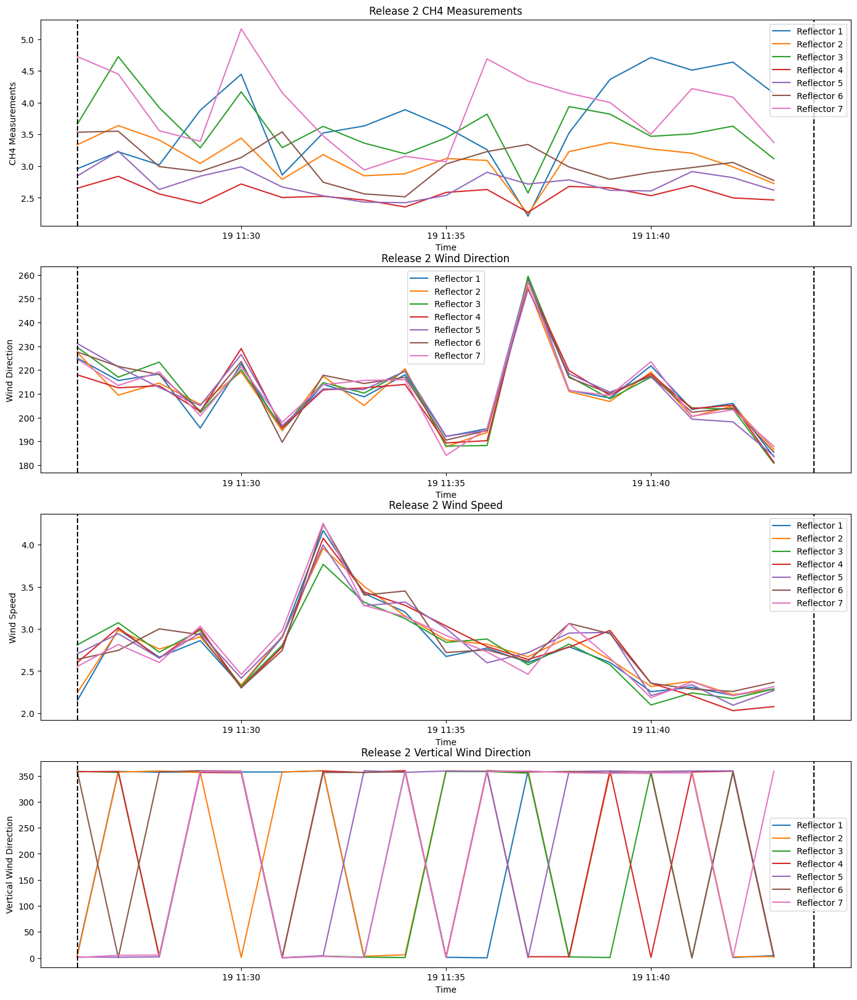

In [25]:
import matplotlib.pyplot as plt
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 2 CH4 Measurements')
plt.plot(reflector_1_rel2_filtered_1min.index, reflector_1_rel2_filtered_1min['Measurements'])
plt.plot(reflector_2_rel2_filtered_1min.index, reflector_2_rel2_filtered_1min['Measurements'])
plt.plot(reflector_3_rel2_filtered_1min.index, reflector_3_rel2_filtered_1min['Measurements'])
plt.plot(reflector_4_rel2_filtered_1min.index, reflector_4_rel2_filtered_1min['Measurements'])
plt.plot(reflector_5_rel2_filtered_1min.index, reflector_5_rel2_filtered_1min['Measurements'])
plt.plot(reflector_6_rel2_filtered_1min.index, reflector_6_rel2_filtered_1min['Measurements'])
plt.plot(reflector_7_rel2_filtered_1min.index, reflector_7_rel2_filtered_1min['Measurements'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 2 Wind Direction')
plt.plot(reflector_1_rel2_filtered_1min.index, reflector_1_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_2_rel2_filtered_1min.index, reflector_2_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_3_rel2_filtered_1min.index, reflector_3_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_4_rel2_filtered_1min.index, reflector_4_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_5_rel2_filtered_1min.index, reflector_5_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_6_rel2_filtered_1min.index, reflector_6_rel2_filtered_1min['Wind Direction'])
plt.plot(reflector_7_rel2_filtered_1min.index, reflector_7_rel2_filtered_1min['Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 2 Wind Speed')
plt.plot(reflector_1_rel2_filtered_1min.index, reflector_1_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_2_rel2_filtered_1min.index, reflector_2_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_3_rel2_filtered_1min.index, reflector_3_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_4_rel2_filtered_1min.index, reflector_4_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_5_rel2_filtered_1min.index, reflector_5_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_6_rel2_filtered_1min.index, reflector_6_rel2_filtered_1min['Wind Speed'])
plt.plot(reflector_7_rel2_filtered_1min.index, reflector_7_rel2_filtered_1min['Wind Speed'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 2 Vertical Wind Direction')
plt.plot(reflector_1_rel2_filtered_1min.index, reflector_1_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_2_rel2_filtered_1min.index, reflector_2_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_3_rel2_filtered_1min.index, reflector_3_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_4_rel2_filtered_1min.index, reflector_4_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_5_rel2_filtered_1min.index, reflector_5_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_6_rel2_filtered_1min.index, reflector_6_rel2_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_7_rel2_filtered_1min.index, reflector_7_rel2_filtered_1min['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('11:26:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('11:43:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

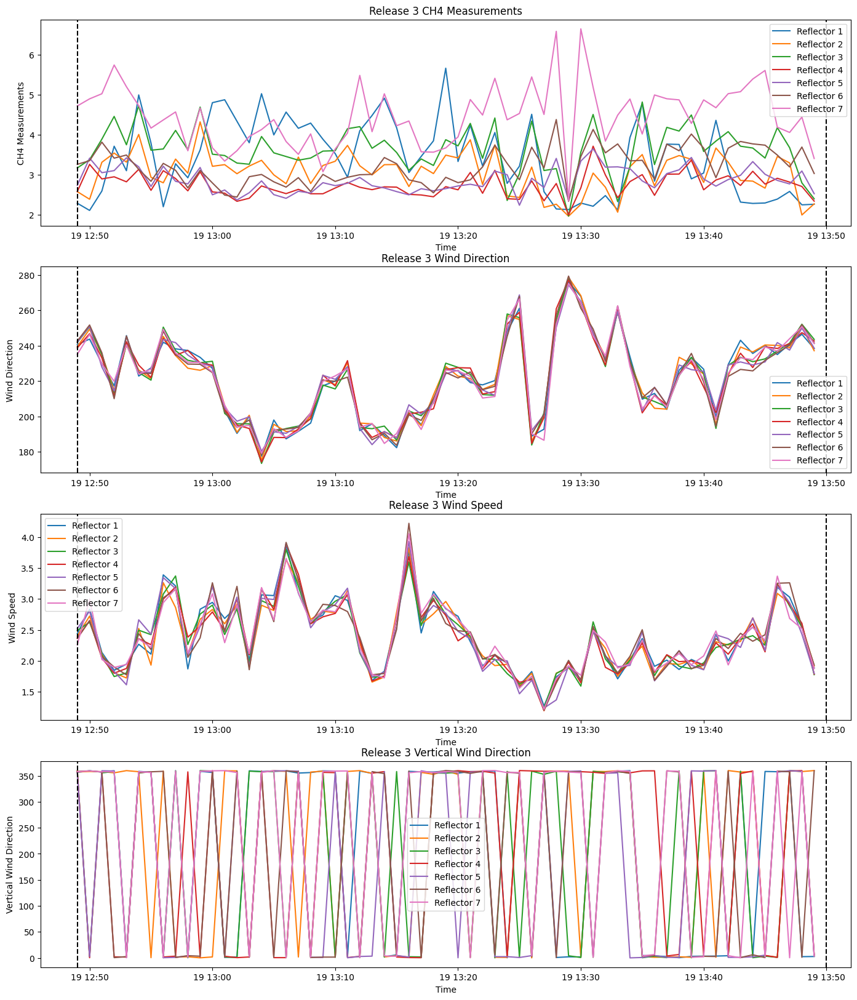

In [26]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 3 CH4 Measurements')
plt.plot(reflector_1_rel3_filtered_1min.index, reflector_1_rel3_filtered_1min['Measurements'])
plt.plot(reflector_2_rel3_filtered_1min.index, reflector_2_rel3_filtered_1min['Measurements'])
plt.plot(reflector_3_rel3_filtered_1min.index, reflector_3_rel3_filtered_1min['Measurements'])
plt.plot(reflector_4_rel3_filtered_1min.index, reflector_4_rel3_filtered_1min['Measurements'])
plt.plot(reflector_5_rel3_filtered_1min.index, reflector_5_rel3_filtered_1min['Measurements'])
plt.plot(reflector_6_rel3_filtered_1min.index, reflector_6_rel3_filtered_1min['Measurements'])
plt.plot(reflector_7_rel3_filtered_1min.index, reflector_7_rel3_filtered_1min['Measurements'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 3 Wind Direction')
plt.plot(reflector_1_rel3_filtered_1min.index, reflector_1_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_2_rel3_filtered_1min.index, reflector_2_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_3_rel3_filtered_1min.index, reflector_3_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_4_rel3_filtered_1min.index, reflector_4_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_5_rel3_filtered_1min.index, reflector_5_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_6_rel3_filtered_1min.index, reflector_6_rel3_filtered_1min['Wind Direction'])
plt.plot(reflector_7_rel3_filtered_1min.index, reflector_7_rel3_filtered_1min['Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 3 Wind Speed')
plt.plot(reflector_1_rel3_filtered_1min.index, reflector_1_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_2_rel3_filtered_1min.index, reflector_2_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_3_rel3_filtered_1min.index, reflector_3_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_4_rel3_filtered_1min.index, reflector_4_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_5_rel3_filtered_1min.index, reflector_5_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_6_rel3_filtered_1min.index, reflector_6_rel3_filtered_1min['Wind Speed'])
plt.plot(reflector_7_rel3_filtered_1min.index, reflector_7_rel3_filtered_1min['Wind Speed'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 3 Vertical Wind Direction')
plt.plot(reflector_1_rel3_filtered_1min.index, reflector_1_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_2_rel3_filtered_1min.index, reflector_2_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_3_rel3_filtered_1min.index, reflector_3_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_4_rel3_filtered_1min.index, reflector_4_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_5_rel3_filtered_1min.index, reflector_5_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_6_rel3_filtered_1min.index, reflector_6_rel3_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_7_rel3_filtered_1min.index, reflector_7_rel3_filtered_1min['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('12:49:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('13:49:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

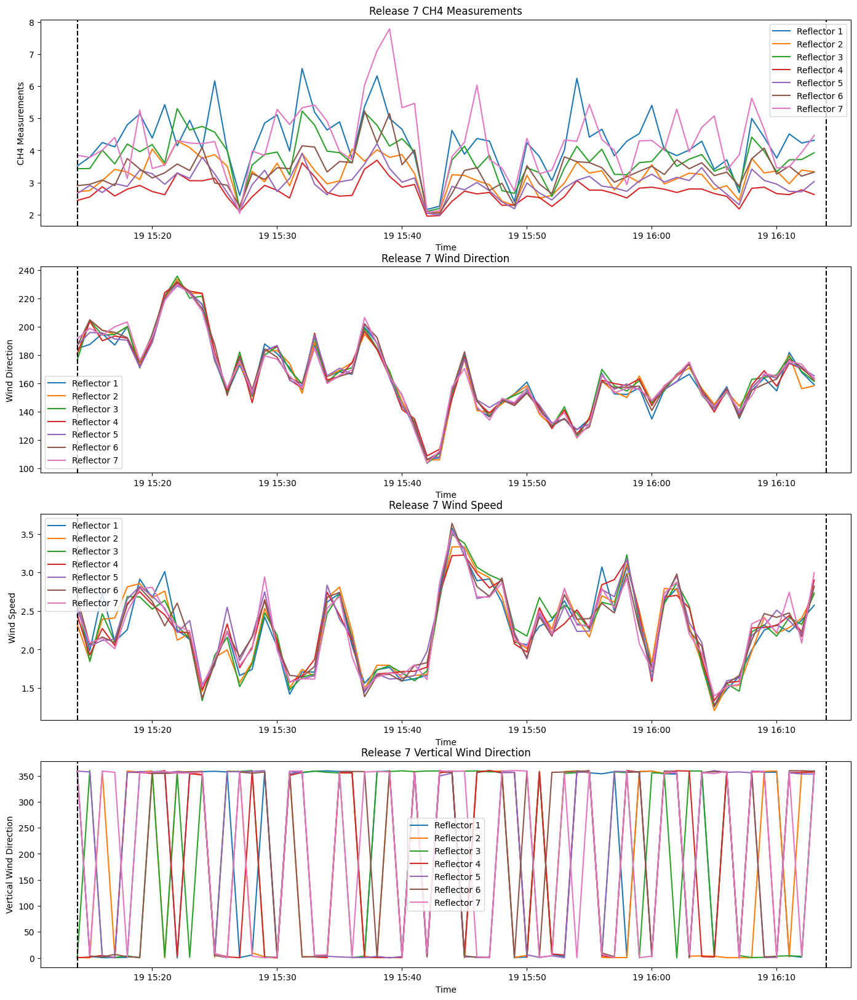

In [27]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Release 7 CH4 Measurements')
plt.plot(reflector_1_rel7_filtered_1min.index, reflector_1_rel7_filtered_1min['Measurements'])
plt.plot(reflector_2_rel7_filtered_1min.index, reflector_2_rel7_filtered_1min['Measurements'])
plt.plot(reflector_3_rel7_filtered_1min.index, reflector_3_rel7_filtered_1min['Measurements'])
plt.plot(reflector_4_rel7_filtered_1min.index, reflector_4_rel7_filtered_1min['Measurements'])
plt.plot(reflector_5_rel7_filtered_1min.index, reflector_5_rel7_filtered_1min['Measurements'])
plt.plot(reflector_6_rel7_filtered_1min.index, reflector_6_rel7_filtered_1min['Measurements'])
plt.plot(reflector_7_rel7_filtered_1min.index, reflector_7_rel7_filtered_1min['Measurements'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Release 7 Wind Direction')
plt.plot(reflector_1_rel7_filtered_1min.index, reflector_1_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_2_rel7_filtered_1min.index, reflector_2_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_3_rel7_filtered_1min.index, reflector_3_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_4_rel7_filtered_1min.index, reflector_4_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_5_rel7_filtered_1min.index, reflector_5_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_6_rel7_filtered_1min.index, reflector_6_rel7_filtered_1min['Wind Direction'])
plt.plot(reflector_7_rel7_filtered_1min.index, reflector_7_rel7_filtered_1min['Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Release 7 Wind Speed')
plt.plot(reflector_1_rel7_filtered_1min.index, reflector_1_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_2_rel7_filtered_1min.index, reflector_2_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_3_rel7_filtered_1min.index, reflector_3_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_4_rel7_filtered_1min.index, reflector_4_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_5_rel7_filtered_1min.index, reflector_5_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_6_rel7_filtered_1min.index, reflector_6_rel7_filtered_1min['Wind Speed'])
plt.plot(reflector_7_rel7_filtered_1min.index, reflector_7_rel7_filtered_1min['Wind Speed'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('Vertical Wind Direction')
plt.title('Release 7 Vertical Wind Direction')
plt.plot(reflector_1_rel7_filtered_1min.index, reflector_1_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_2_rel7_filtered_1min.index, reflector_2_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_3_rel7_filtered_1min.index, reflector_3_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_4_rel7_filtered_1min.index, reflector_4_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_5_rel7_filtered_1min.index, reflector_5_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_6_rel7_filtered_1min.index, reflector_6_rel7_filtered_1min['Vertical Wind Direction'])
plt.plot(reflector_7_rel7_filtered_1min.index, reflector_7_rel7_filtered_1min['Vertical Wind Direction'])
plt.axvline(x=pd.Timestamp('15:14:00'), color='black', linestyle='--')
plt.axvline(x=pd.Timestamp('16:13:59'), color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])


plt.show()

<br>
<br>
<br>

## D. Averaging wind fields and tan(gamma)

In [28]:
def average_wind_fields(dfs):
    # Initialize DataFrames to store the average wind speed and direction
    df_avg_speed = pd.DataFrame()
    df_avg_direction = pd.DataFrame()
    df_avg_tan_gamma_horizontal = pd.DataFrame()
    df_avg_tan_gamma_vertical = pd.DataFrame()

    # Calculate the average wind speed and direction
    for df in dfs:
        df_avg_speed = pd.concat([df_avg_speed, df['Wind Speed']], axis=1)
        df_avg_direction = pd.concat([df_avg_direction, df['Wind Direction']], axis=1)
        df_avg_rad_direction = np.deg2rad(df_avg_direction)
        df_avg_tan_gamma_horizontal = pd.concat([df_avg_tan_gamma_horizontal, df['Tan_gamma Horizontal']], axis=1)
        df_avg_rad_tan_gamma_horizontal = np.deg2rad(df_avg_tan_gamma_horizontal)
        df_avg_tan_gamma_vertical = pd.concat([df_avg_tan_gamma_vertical, df['Tan_gamma Vertical']], axis=1)
        df_avg_rad_tan_gamma_vertical = np.deg2rad(df_avg_tan_gamma_vertical)

    df_avg = pd.DataFrame()
    df_avg['Average Speed'] = df_avg_speed.mean(axis=1)
    df_avg['Average Direction'] = np.rad2deg(df_avg_rad_direction.apply(lambda x: circmean(x), axis=1))
    df_avg['Average Tan_gamma Horizontal'] = np.rad2deg(df_avg_rad_tan_gamma_horizontal.apply(lambda x: circmean(x), axis=1))
    df_avg['Average Tan_gamma Vertical'] = np.rad2deg(df_avg_rad_tan_gamma_vertical.apply(lambda x: circmean(x), axis=1))

    return df_avg

In [29]:
dfs_rel2 = [reflector_1_rel2_filtered_1min, reflector_2_rel2_filtered_1min, reflector_3_rel2_filtered_1min, reflector_4_rel2_filtered_1min, reflector_5_rel2_filtered_1min, reflector_6_rel2_filtered_1min, reflector_7_rel2_filtered_1min]
dfs_rel3 = [reflector_1_rel3_filtered_1min, reflector_2_rel3_filtered_1min, reflector_3_rel3_filtered_1min, reflector_4_rel3_filtered_1min, reflector_5_rel3_filtered_1min, reflector_6_rel3_filtered_1min, reflector_7_rel3_filtered_1min]
dfs_rel7 = [reflector_1_rel7_filtered_1min, reflector_2_rel7_filtered_1min, reflector_3_rel7_filtered_1min, reflector_4_rel7_filtered_1min, reflector_5_rel7_filtered_1min, reflector_6_rel7_filtered_1min, reflector_7_rel7_filtered_1min]

av_rel2_wind_field = average_wind_fields(dfs_rel2)
av_rel3_wind_field = average_wind_fields(dfs_rel3)
av_rel7_wind_field = average_wind_fields(dfs_rel7)
print(av_rel2_wind_field.shape, av_rel3_wind_field.shape, av_rel7_wind_field.shape)

(18, 4) (61, 4) (60, 4)


In [30]:
source_1_wind_field = pd.concat([av_rel2_wind_field, av_rel3_wind_field, av_rel7_wind_field], axis=0).reset_index(drop=True)
source_1_wind_field

,Average Speed,Average Direction,Average Tan_gamma Horizontal,Average Tan_gamma Vertical
0,2.529329,226.166649,0.227258,0.135270
1,2.939350,215.829043,0.337311,0.198843
2,2.722847,217.057046,0.316576,0.188975
3,2.953901,202.037573,0.321976,0.174960
4,2.350180,223.174301,0.323030,0.164275
...,...,...,...,...
134,2.350765,164.940863,0.233690,0.190516
135,2.309250,162.287127,0.253769,0.185611
136,2.422438,177.557325,0.335622,0.186498
137,2.256529,168.427323,0.302266,0.215282


In [31]:
reflector_1_source1_data = pd.concat([reflector_1_rel2_filtered_1min['Measurements'], reflector_1_rel3_filtered_1min['Measurements'], reflector_1_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_2_source1_data = pd.concat([reflector_2_rel2_filtered_1min['Measurements'], reflector_2_rel3_filtered_1min['Measurements'], reflector_2_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_3_source1_data = pd.concat([reflector_3_rel2_filtered_1min['Measurements'], reflector_3_rel3_filtered_1min['Measurements'], reflector_3_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_4_source1_data = pd.concat([reflector_4_rel2_filtered_1min['Measurements'], reflector_4_rel3_filtered_1min['Measurements'], reflector_4_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_5_source1_data = pd.concat([reflector_5_rel2_filtered_1min['Measurements'], reflector_5_rel3_filtered_1min['Measurements'], reflector_5_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_6_source1_data = pd.concat([reflector_6_rel2_filtered_1min['Measurements'], reflector_6_rel3_filtered_1min['Measurements'], reflector_6_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)
reflector_7_source1_data = pd.concat([reflector_7_rel2_filtered_1min['Measurements'], reflector_7_rel3_filtered_1min['Measurements'], reflector_7_rel7_filtered_1min['Measurements']], axis=0).reset_index(drop=True)

In [33]:
source_1_observations = pd.DataFrame(pd.concat([reflector_1_source1_data, reflector_2_source1_data, reflector_3_source1_data, reflector_4_source1_data, reflector_5_source1_data, reflector_6_source1_data, reflector_7_source1_data], axis=0).reset_index(drop=True))
source_1_observations

,Measurements
0,2.957493
1,3.225206
2,3.019588
3,3.879900
4,4.447954
...,...
968,4.647827
969,3.454171
970,3.486773
971,3.936550


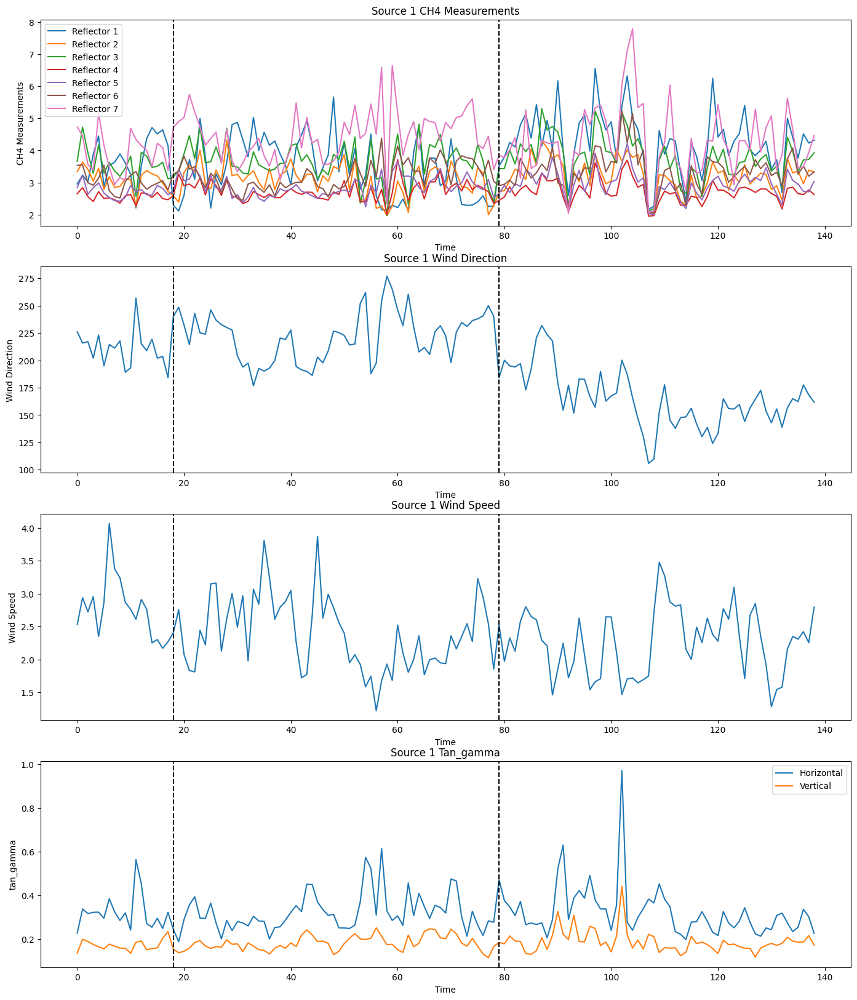

In [34]:
plt.figure(figsize=(17,20))
plt.subplot(4,1,1)
plt.xlabel('Time')
plt.ylabel('CH4 Measurements')
plt.title('Source 1 CH4 Measurements')
plt.plot(np.arange(139), reflector_1_source1_data)
plt.plot(np.arange(139), reflector_2_source1_data)
plt.plot(np.arange(139), reflector_3_source1_data)
plt.plot(np.arange(139), reflector_4_source1_data)
plt.plot(np.arange(139), reflector_5_source1_data)
plt.plot(np.arange(139), reflector_6_source1_data)
plt.plot(np.arange(139), reflector_7_source1_data)
plt.axvline(x=18, color='black', linestyle='--')
plt.axvline(x=18+61, color='black', linestyle='--')
plt.legend(['Reflector 1', 'Reflector 2', 'Reflector 3', 'Reflector 4', 'Reflector 5', 'Reflector 6', 'Reflector 7'])

plt.subplot(4,1,2)
plt.xlabel('Time')
plt.ylabel('Wind Direction')
plt.title('Source 1 Wind Direction')
plt.plot(source_1_wind_field.index, source_1_wind_field['Average Direction'])
plt.axvline(x=18, color='black', linestyle='--')
plt.axvline(x=18+61, color='black', linestyle='--')

plt.subplot(4,1,3)
plt.xlabel('Time')
plt.ylabel('Wind Speed')
plt.title('Source 1 Wind Speed')
plt.plot(source_1_wind_field.index, source_1_wind_field['Average Speed'])
plt.axvline(x=18, color='black', linestyle='--')
plt.axvline(x=18+61, color='black', linestyle='--')

plt.subplot(4,1,4)
plt.xlabel('Time')
plt.ylabel('tan_gamma')
plt.title('Source 1 Tan_gamma')
plt.plot(source_1_wind_field.index, source_1_wind_field['Average Tan_gamma Horizontal'])
plt.plot(source_1_wind_field.index, source_1_wind_field['Average Tan_gamma Vertical'])
plt.axvline(x=18, color='black', linestyle='--')
plt.axvline(x=18+61, color='black', linestyle='--')
plt.legend(['Horizontal', 'Vertical'])

plt.show()

## E. Saving data

In [35]:
# with open('Chilbolton_data_source_1.pkl', 'wb') as f:
#     pickle.dump(source_1_observations, f)


In [35]:
# with open('Chilbolton_source1_1min_windfield.pkl', 'wb') as f:
#     pickle.dump(source_1_wind_field, f)


<br>
<br>
<br>

<br>
<br>
<br>
<br>

### D. Reflector locations and sources

#### D.1 From Degree Minutes Seconds to Decimal Degrees

In [2]:
def DMS_to_decimal_degrees(degrees, minutes, seconds):
    lat_decimal_degrees = degrees + minutes/60 + seconds/3600
    return lat_decimal_degrees

In [3]:
los_sens_lat = DMS_to_decimal_degrees(51, 8, 56.1)
los_sens_long = DMS_to_decimal_degrees(1, 26, 17.10)

ref1_lat = DMS_to_decimal_degrees(51, 8, 55.11)
ref1_long = DMS_to_decimal_degrees(1, 26, 17.96)

ref2_lat = DMS_to_decimal_degrees(51, 8, 54.11)
ref2_long = DMS_to_decimal_degrees(1, 26, 18.14)

ref3_lat = DMS_to_decimal_degrees(51, 8, 54.68)
ref3_long = DMS_to_decimal_degrees(1, 26, 17.51)

ref4_lat = DMS_to_decimal_degrees(51, 8, 52.97)
ref4_long = DMS_to_decimal_degrees(1, 26, 17.93)

ref5_lat = DMS_to_decimal_degrees(51, 8, 53.41)
ref5_long = DMS_to_decimal_degrees(1, 26, 17.14)

ref6_lat = DMS_to_decimal_degrees(51, 8, 54.22)
ref6_long = DMS_to_decimal_degrees(1, 26, 16.85)

ref7_lat = DMS_to_decimal_degrees(51, 8, 55.03)
ref7_long = DMS_to_decimal_degrees(1, 26, 16.78)

print(los_sens_lat, los_sens_long)

51.148916666666665 1.4380833333333334


#### D.2 Obtaining the UTM Zone

In [4]:
def get_utm_zone(long_decimal_degrees):
    return int((long_decimal_degrees + 180) / 6) + 1

In [5]:
utm_zone = get_utm_zone(los_sens_long)
print(f'UTM Zone: {utm_zone}')

UTM Zone: 31


#### D.3 From Decimal Degree to Meters

In [6]:
import pyproj

def latlon_to_xy(latitude, longitude):
    utm = pyproj.Proj(proj='utm', zone=31, ellps='WGS84')  
    x, y = utm(longitude, latitude)
    return x, y

In [7]:
sens_x, sens_y = latlon_to_xy(los_sens_lat, los_sens_long)
ref1_x, ref1_y = latlon_to_xy(ref1_lat, ref1_long)
ref2_x, ref2_y = latlon_to_xy(ref2_lat, ref2_long)
ref3_x, ref3_y = latlon_to_xy(ref3_lat, ref3_long)
ref4_x, ref4_y = latlon_to_xy(ref4_lat, ref4_long)
ref5_x, ref5_y = latlon_to_xy(ref5_lat, ref5_long)
ref6_x, ref6_y = latlon_to_xy(ref6_lat, ref6_long)
ref7_x, ref7_y = latlon_to_xy(ref7_lat, ref7_long)
print(sens_x, sens_y)

390755.01045668696 5667544.959293069


#### My reflector location coordinates

In [7]:
print(f'ref1_x: {ref1_x - sens_x}, ref1_y: {ref1_y - sens_y}')
print(f'ref2_x: {ref2_x - sens_x}, ref2_y: {ref2_y - sens_y}')
print(f'ref3_x: {ref3_x - sens_x}, ref3_y: {ref3_y - sens_y}')
print(f'ref4_x: {ref4_x - sens_x}, ref4_y: {ref4_y - sens_y}')
print(f'ref5_x: {ref5_x - sens_x}, ref5_y: {ref5_y - sens_y}')
print(f'ref6_x: {ref6_x - sens_x}, ref6_y: {ref6_y - sens_y}')
print(f'ref7_x: {ref7_x - sens_x}, ref7_y: {ref7_y - sens_y}')


ref1_x: 16.058444041234907, ref1_y: -30.934176820330322
ref2_x: 18.899630916886963, ref2_y: -61.89671668410301
ref3_x: 7.033964307163842, ref3_y: -44.030516372062266
ref4_x: 14.07216209161561, ref4_y: -97.02274801488966
ref5_x: -0.9873021469684318, ref5_y: -83.1060093762353
ref6_x: -6.090072019258514, ref6_y: -57.96685132756829
ref7_x: -6.918693917279597, ref7_y: -32.918454583734274


#### Shell's Reflector location coordinates

In [8]:
print(f'ref1_x: {609228.93 - 609245}, ref1_y: {5667514.03 - 5667545}')
print(f'ref2_x: {609226.09 - 609245}, ref2_y: {5667483.06 - 5667545}')
print(f'ref3_x: {609237.96 - 609245}, ref3_y: {5667500.93 - 5667545}')
print(f'ref4_x: {609230.92 - 609245}, ref4_y: {5667447.94 - 5667545}')
print(f'ref5_x: {609245.98 - 609245}, ref5_y: {5667461.85 - 5667545}')
print(f'ref6_x: {609251.08 - 609245}, ref6_y: {5667486.99 - 5667545}')
print(f'ref7_x: {609251.91 - 609245}, ref7_y: {5667512.04 - 5667545}')

ref1_x: -16.069999999948777, ref1_y: -30.96999999973923
ref2_x: -18.910000000032596, ref2_y: -61.94000000040978
ref3_x: -7.040000000037253, ref3_y: -44.07000000029802
ref4_x: -14.07999999995809, ref4_y: -97.05999999959022
ref5_x: 0.9799999999813735, ref5_y: -83.15000000037253
ref6_x: 6.0799999999580905, ref6_y: -58.00999999977648
ref7_x: 6.910000000032596, ref7_y: -32.95999999996275


The latitude sign is flipped between my locations and Shells. Possibly due to how Mirico records data. Therefore need to flip sign of my code.

In [9]:
sensor_x, sensor_y = 60, 100
instruments_location = {
    "line_of_sight_sensor": [0 + sensor_x, 0 + sensor_y, 1.6],
    "reflector_1": [sensor_x-(ref1_x - sens_x), sensor_y + (ref1_y - sens_y), 1.6],
    "reflector_2": [sensor_x-(ref2_x - sens_x), sensor_y + (ref2_y - sens_y), 1.6],
    "reflector_3": [sensor_x-(ref3_x - sens_x), sensor_y + (ref3_y - sens_y), 1.6],
    "reflector_4": [sensor_x-(ref4_x - sens_x), sensor_y + (ref4_y - sens_y), 1.6],
    "reflector_5": [sensor_x-(ref5_x - sens_x), sensor_y + (ref5_y - sens_y), 1.6],
    "reflector_6": [sensor_x-(ref6_x - sens_x), sensor_y + (ref6_y - sens_y), 1.6],
    "reflector_7": [sensor_x-(ref7_x - sens_x), sensor_y + (ref7_y - sens_y), 1.6],
}
print(instruments_location)

{'line_of_sight_sensor': [60, 100, 1.6], 'reflector_1': [43.94155595876509, 69.06582317966968, 1.6], 'reflector_2': [41.10036908311304, 38.10328331589699, 1.6], 'reflector_3': [52.96603569283616, 55.969483627937734, 1.6], 'reflector_4': [45.92783790838439, 2.9772519851103425, 1.6], 'reflector_5': [60.98730214696843, 16.893990623764694, 1.6], 'reflector_6': [66.09007201925851, 42.03314867243171, 1.6], 'reflector_7': [66.9186939172796, 67.08154541626573, 1.6]}


#### D.4 Saving Instruments Locations

In [ ]:
# import pickle
# with open('Chilbolton_instruments_location.pkl', 'wb') as f:
#     pickle.dump(instruments_location, f)


#### D.5 Sources

In [10]:
source1 = [609253.91, 5667537.75]
source2 = [609243.82, 5667498.82]
source3 = [609251.37, 5667449.58]
source4 = [609255.57, 5667496.37]

In [16]:
source_locations = {
    "source_1": [sensor_x + (source1[0] - 609245), sensor_y + (source1[1] - 5667545), 1.6],
    "source_2": [sensor_x + (source2[0] - 609245), sensor_y + (source2[1] - 5667545), 1.6],
    "source_3": [sensor_x + (source3[0] - 609245), sensor_y + (source3[1] - 5667545), 1.6],
    "source_4": [sensor_x + (source4[0] - 609245), sensor_y + (source4[1] - 5667545), 1.6],
}
print(source_locations)

{'source_1': [68.9100000000326, 92.75, 1.6], 'source_2': [58.81999999994878, 53.82000000029802, 1.6], 'source_3': [66.36999999999534, 4.580000000074506, 1.6], 'source_4': [70.56999999994878, 51.37000000011176, 1.6]}


In [17]:
# import pickle
# with open('Chilbolton_sources_location.pkl', 'wb') as f:
#     pickle.dump(source_locations, f)